# Librerias y datos

In [ ]:
!pip install lime

In [ ]:
import scipy
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from google.colab import drive
import pandas as pd
import numpy as np
import nltk
drive.mount('/content/gdrive')
import csv
import tensorflow
tensorflow.config.run_functions_eagerly(True)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Conv1D, GlobalMaxPooling1D
from tensorflow.keras.datasets import imdb
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import requests
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
from sklearn.metrics import confusion_matrix
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from imblearn.combine import SMOTEENN

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


**DATOS**

In [ ]:
data= pd.read_csv("/content/gdrive/MyDrive/TESIS/BaseCOMPLETA.csv")

FRECUENCIA DE PALABRAS

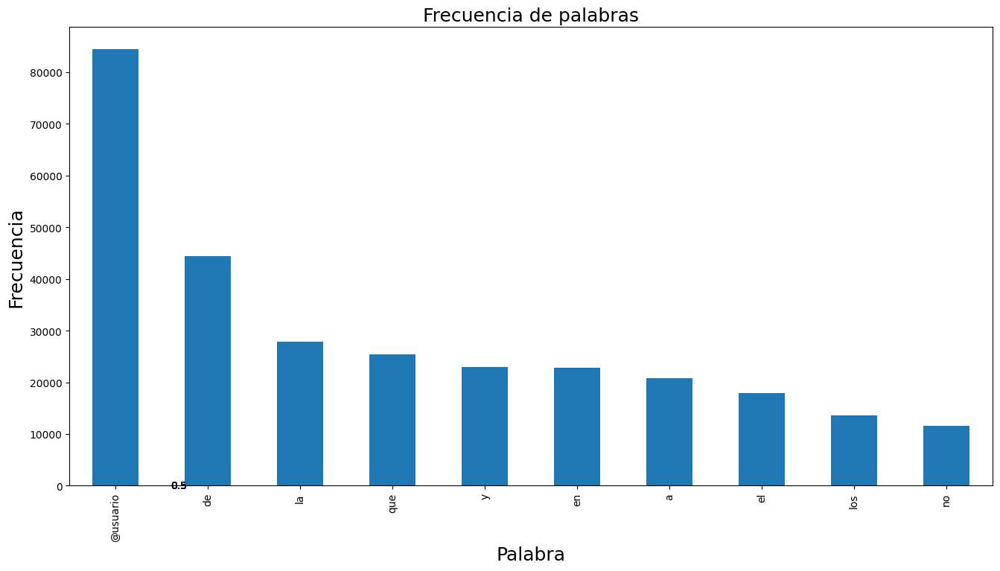

In [ ]:
def histogram(word_list, n):
    # Contar la frecuencia de cada palabra
    counts = Counter(word_list)
    # Convertir el diccionario en una serie de pandas
    serie = pd.Series(counts)
    # Ordenar la serie de forma descendente y seleccionar las primeras n palabras
    first_n = serie.sort_values(ascending=False).head(n)
    # Crear el gráfico de barras horizontal
    ax = first_n.plot.bar(figsize=(16, 8))
    # Añadir las etiquetas de las frecuencias dentro de cada barra
    for i, bar in enumerate(ax.patches):
        ax.text(bar.get_width() + 0.1, i, str(bar.get_width()), ha='left', va='center')
    # Añadir el título y la leyenda
    plt.title("Frecuencia de palabras",fontsize=18)
    plt.ylabel("Frecuencia",fontsize=18)
    plt.xlabel("Palabra",fontsize=18)
    # Mostrar el gráfico
    plt.show()

# Ejemplo de uso de la función con un dataframe de pandas
# Asignar el nombre del dataframe a la variable dataset
dataset = data
# Obtener una lista de palabras por cada fila de la columna que contiene el texto
word_list = dataset['ProcTwe'].str.split()
# Convertir la lista de palabras en una serie de pandas
word_list = word_list.explode()
# Llamar a la función con la serie de palabras y el número de palabras más frecuentes que queremos mostrar
histogram(word_list, 10)


LIMPIEZA DE STOP WORDS

In [ ]:
stop_words = stopwords.words('spanish')
newStopWords = ['usuario','hashtag','url','usuario usuario','@usuario']
stop_words.extend(newStopWords)
data['ProcTwe'] = data['ProcTwe'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

BAG OF WORDS

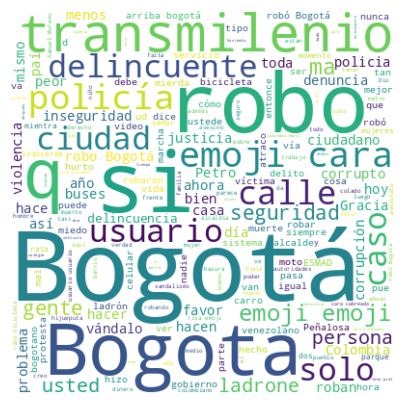

In [ ]:
combined_text = " ".join(data['ProcTwe'].tolist())
wordcloud = WordCloud(background_color="white", width=400, height=400).generate(combined_text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

FUNCION GRAFICADORA DE EPOCAS DE ENTRENAMIENTO

In [ ]:
def plot_graphs(history, string,tipo):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+string])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  plt.legend([string, 'Validation_'+string])
  plt.title('Rendimiento sobre las épocas'+tipo)
  plt.show()

F1 SCORE

In [ ]:
from keras import backend as K

def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val


# MODELO 1 a 5 SENCILLO

DIVISION DATASET

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(data['ProcTwe'],
                                                    data['Sentiment'],
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    random_state=0)

print('Tamaño del conjunto de entrenamiento:',len(x_train), len(y_train))
print('Tamaño del conjunto de validación:',len(x_test), len(y_test))

Tamaño del conjunto de entrenamiento: 22553 22553
Tamaño del conjunto de validación: 5639 5639


In [ ]:
y_train = y_train - 1
y_train = tensorflow.keras.utils.to_categorical(y_train, 5)
y_test = y_test - 1
y_test = tensorflow.keras.utils.to_categorical(y_test, 5)

HIPERPARAMETROS

In [ ]:
vocab_size = 10000
embedding_dim = 100
max_length = 200
trunc_type = 'post'
padding_type = 'post'
oov_tok = '<OOV>'

In [ ]:
train_articles=x_train.tolist()
validation_articles=x_test.tolist()

TOKENIZADO

In [ ]:
tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok, lower=True)
tokenizer.fit_on_texts(train_articles)
word_index = tokenizer.word_index
#dict(list(word_index.items())[:10])

In [ ]:
train_sequences = tokenizer.texts_to_sequences(train_articles)
train_padded = pad_sequences(train_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
validation_sequences = tokenizer.texts_to_sequences(validation_articles)
validation_padded = pad_sequences(validation_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)


MODELO

In [ ]:
model = tensorflow.keras.Sequential([
    tensorflow.keras.layers.Embedding(vocab_size, embedding_dim),
    tensorflow.keras.layers.Dropout(0.3),
    tensorflow.keras.layers.Bidirectional(tensorflow.keras.layers.LSTM(embedding_dim)),
    tensorflow.keras.layers.Dense(embedding_dim, activation='relu'),
    tensorflow.keras.layers.Dropout(0.3),
    tensorflow.keras.layers.Dense(5, activation='softmax')
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 100)         1000000   
                                                                 
 dropout (Dropout)           (None, None, 100)         0         
                                                                 
 bidirectional (Bidirection  (None, 200)               160800    
 al)                                                             
                                                                 
 dense (Dense)               (None, 100)               20100     
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 5)                 505       
                                                        

ENTRENAMIENTO

In [ ]:
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0001)
loss = 'categorical_crossentropy'
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

epochs = 12
batch_size=32

early_stop = tensorflow.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
checkpoint = tensorflow.keras.callbacks.ModelCheckpoint('modelSENCILLO.h5', save_best_only=True)
log_dir = './logs'
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
callbacks = [early_stop, checkpoint, tensorboard_callback]
history = model.fit(train_padded,
                    y_train,
                    epochs=epochs, batch_size=batch_size, validation_data=(validation_padded,y_test), callbacks=callbacks, verbose=1)

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/12
705/705 [==============================] - ETA: 0s - loss: 1.2295 - accuracy: 0.5273

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


705/705 [==============================] - 91s 119ms/step - loss: 1.2295 - accuracy: 0.5273 - val_loss: 1.1677 - val_accuracy: 0.5402
Epoch 2/12
705/705 [==============================] - 67s 96ms/step - loss: 1.1761 - accuracy: 0.5338 - val_loss: 1.1074 - val_accuracy: 0.5402
Epoch 3/12
705/705 [==============================] - 66s 93ms/step - loss: 1.0765 - accuracy: 0.5428 - val_loss: 1.0554 - val_accuracy: 0.5503
Epoch 4/12
705/705 [==============================] - 67s 95ms/step - loss: 0.9991 - accuracy: 0.5713 - val_loss: 1.0453 - val_accuracy: 0.5607
Epoch 5/12
705/705 [==============================] - 66s 93ms/step - loss: 0.9255 - accuracy: 0.6102 - val_loss: 1.0549 - val_accuracy: 0.5593
Epoch 6/12
705/705 [==============================] - 66s 93ms/step - loss: 0.8662 - accuracy: 0.6416 - val_loss: 1.0831 - val_accuracy: 0.5426
Epoch 7/12
705/705 [==============================] - 65s 93ms/step - loss: 0.8165 - accuracy: 0.6688 - val_loss: 1.1129 - val_accuracy: 0.5288
Ep

GRAFICA

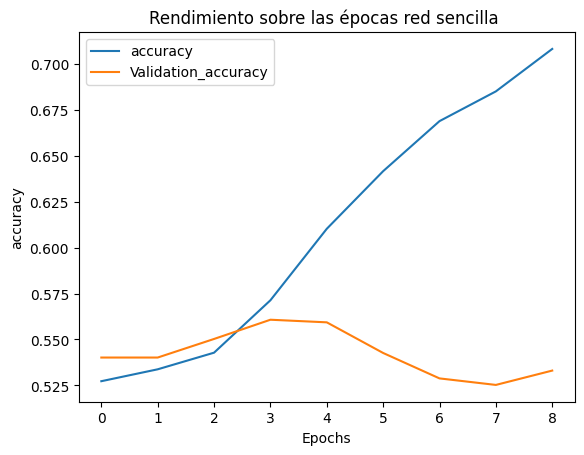

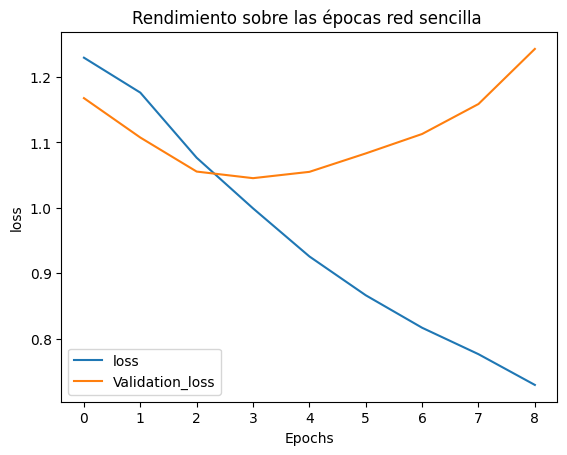

In [ ]:
plot_graphs(history, "accuracy"," red sencilla ")
plot_graphs(history, "loss"," red sencilla ")

F1 SCORE

In [ ]:
from sklearn.metrics import f1_score as f1_s

y_pred = model.predict(validation_padded)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir predicciones a etiquetas

# Asumiendo que y_test ya está en formato categórico (one-hot encoded), conviértelo a etiquetas también
y_true_classes = np.argmax(y_test, axis=1)

f1 = f1_s(y_true_classes, y_pred_classes, average='macro')  # 'macro' para un promedio multiclase
print("F1 Score en y_test:", f1)

177/177 [==============================] - 4s 22ms/step
F1 Score en y_test: 0.33582044187681387


MATRIZ DE CONFUSION SENCILLA

  7/177 [>.............................] - ETA: 3s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


177/177 [==============================] - 3s 18ms/step
[[ 352  989  103   24    0]
 [ 389 2302  301   54    0]
 [  42  424  254   42    0]
 [  14   91   84   98    0]
 [   5   20   20   31    0]]


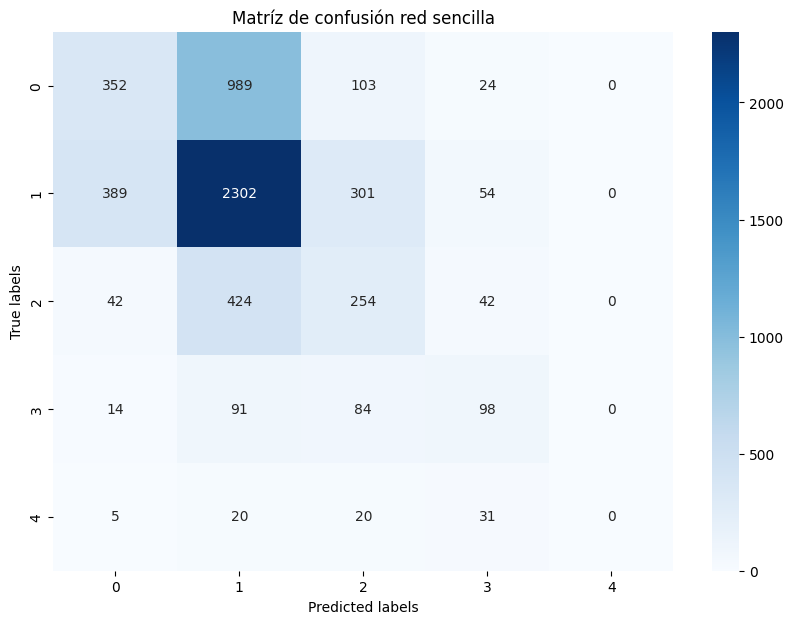

In [ ]:
predictions = model.predict(validation_padded)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)
cm = confusion_matrix(true_labels, predicted_labels)
print(cm)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Matríz de confusión red sencilla')
plt.show()

LIME

In [ ]:
explainer = LimeTextExplainer(class_names=["Clase 1", "Clase 2", "Clase 3","Clase 4", "clase 5"])

def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
    return model.predict(padded_sequences)

text_instance = "Creería q' esa asquienta costumbre de colarse en el Transmilenio (robo descarado y vergonzoso) es herencia de Petro, quien en algún momento los indujo a semejante conducta como una repudio hacia la obra del Dr. Peñalosa."
exp = explainer.explain_instance(text_instance, predict_proba, num_features=10, top_labels=5)
exp.show_in_notebook()
exp.save_to_file('limeSencillo.html')

  7/157 [>.............................] - ETA: 2s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


157/157 [==============================] - 3s 18ms/step


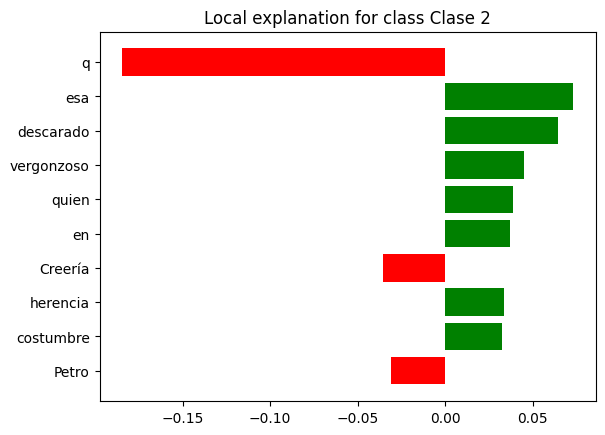

In [ ]:
fig = exp.as_pyplot_figure()


# BALANCEO DE CLASES POSTERIOR A SENCILLO

In [ ]:
# 1. Carga el modelo previamente guardado
loaded_model = tensorflow.keras.models.load_model('modelSENCILLO.h5', custom_objects={"f1_score": f1_score})
#loaded_model = tensorflow.keras.models.load_model('/content/model (1).h5', custom_objects={"f1_score": f1_score})

# 2. Si deseas, puedes ajustar el learning rate o usar el mismo optimizer
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.001)  # Puedes omitir esta línea si no quieres cambiar el learning rate
class_weights={0:0.76697841 , 1:0.37426153 , 2:1.52642978,  3:3.51019455, 4:11.87 }

# 3. Compila el modelo nuevamente (esto es opcional si no has cambiado nada)
loaded_model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])  # Omitir si no has hecho cambios

# 4. Continúa entrenando el modelo con los datos
history = loaded_model.fit(train_padded, y_train, class_weight=class_weights, epochs=epochs, batch_size=batch_size, validation_data=(validation_padded, y_test), callbacks=callbacks, verbose=1)

Epoch 1/12


/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


705/705 [==============================] - 66s 93ms/step - loss: 1.3431 - accuracy: 0.4393 - val_loss: 1.3433 - val_accuracy: 0.4267
Epoch 2/12
705/705 [==============================] - 66s 94ms/step - loss: 1.0472 - accuracy: 0.5192 - val_loss: 1.2935 - val_accuracy: 0.4111
Epoch 3/12
705/705 [==============================] - 66s 94ms/step - loss: 0.7815 - accuracy: 0.5976 - val_loss: 1.2446 - val_accuracy: 0.4584
Epoch 4/12
705/705 [==============================] - 67s 94ms/step - loss: 0.6086 - accuracy: 0.6612 - val_loss: 1.3580 - val_accuracy: 0.4451
Epoch 5/12
705/705 [==============================] - 66s 94ms/step - loss: 0.4914 - accuracy: 0.7094 - val_loss: 1.4717 - val_accuracy: 0.4299
Epoch 6/12
705/705 [==============================] - 67s 95ms/step - loss: 0.4096 - accuracy: 0.7486 - val_loss: 1.5743 - val_accuracy: 0.4455
Epoch 7/12
705/705 [==============================] - 66s 94ms/step - loss: 0.3476 - accuracy: 0.7836 - val_loss: 1.7096 - val_accuracy: 0.4300
Epo

GRAFICA

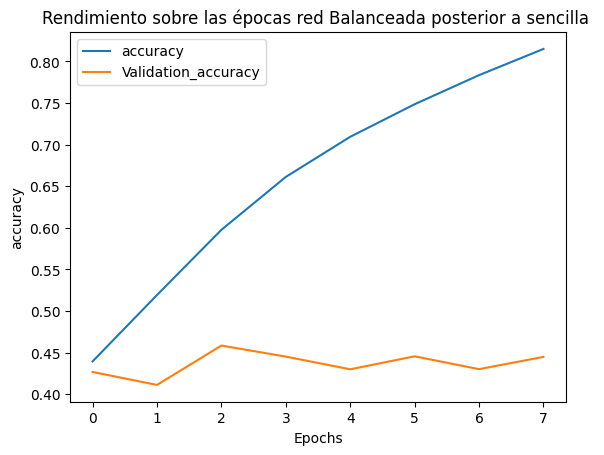

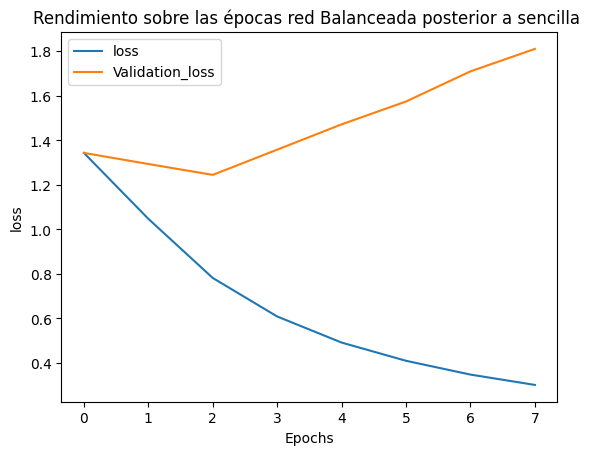

In [ ]:
plot_graphs(history, "accuracy"," red Balanceada posterior a sencilla ")
plot_graphs(history, "loss"," red Balanceada posterior a sencilla ")

F1 SCORE

In [ ]:
from sklearn.metrics import f1_score as f1_s

y_pred = loaded_model.predict(validation_padded)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir predicciones a etiquetas

# Asumiendo que y_test ya está en formato categórico (one-hot encoded), conviértelo a etiquetas también
y_true_classes = np.argmax(y_test, axis=1)

f1 = f1_s(y_true_classes, y_pred_classes, average='macro')  # 'macro' para un promedio multiclase
print("F1 Score en y_test:", f1)

177/177 [==============================] - 3s 18ms/step
F1 Score en y_test: 0.33582044187681387


MATRIZ DE CONFUSION POSTERIOR A SENCILLA

  7/177 [>.............................] - ETA: 3s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


177/177 [==============================] - 3s 18ms/step
[[ 352  989  103   24    0]
 [ 389 2302  301   54    0]
 [  42  424  254   42    0]
 [  14   91   84   98    0]
 [   5   20   20   31    0]]


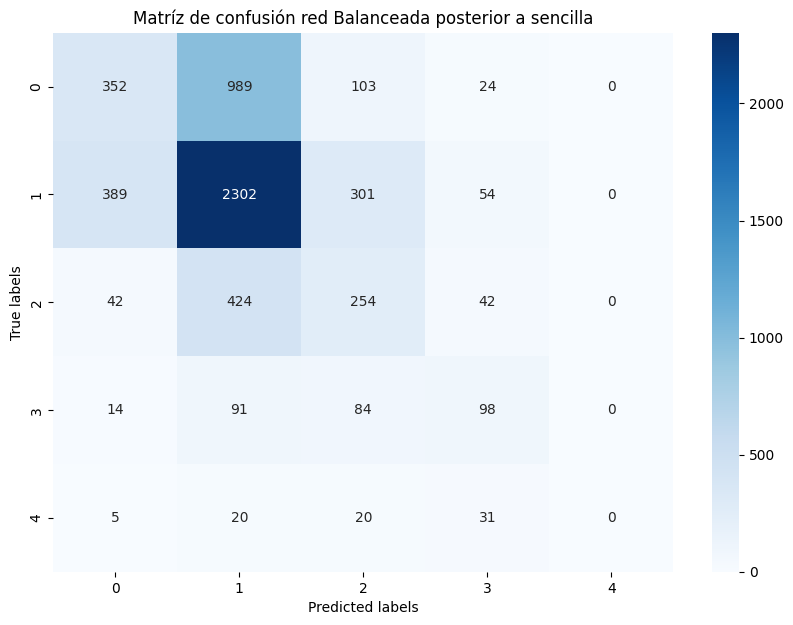

In [ ]:
predictions = loaded_model.predict(validation_padded)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)
cm = confusion_matrix(true_labels, predicted_labels)
print(cm)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Matríz de confusión red Balanceada posterior a sencilla')
plt.show()

LIME

In [ ]:
explainer = LimeTextExplainer(class_names=["Clase 1", "Clase 2", "Clase 3","Clase 4", "clase 5"])

def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
    return loaded_model.predict(padded_sequences)

text_instance = "Creería q' esa asquienta costumbre de colarse en el Transmilenio (robo descarado y vergonzoso) es herencia de Petro, quien en algún momento los indujo a semejante conducta como una repudio hacia la obra del Dr. Peñalosa."
exp = explainer.explain_instance(text_instance, predict_proba, num_features=10, top_labels=5)
exp.show_in_notebook()
exp.save_to_file('limeSencilloBalanceado.html')

  7/157 [>.............................] - ETA: 2s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


157/157 [==============================] - 4s 23ms/step


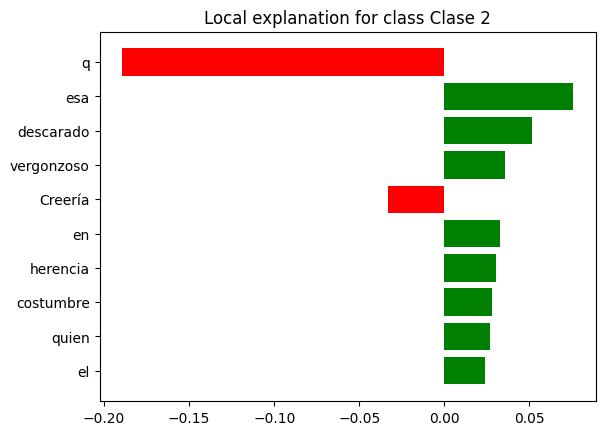

In [ ]:
fig = exp.as_pyplot_figure()


# Balanceo inicial

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(data['ProcTwe'],
                                                    data['Sentiment'],
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    random_state=0)

print('Tamaño del conjunto de entrenamiento:',len(x_train), len(y_train))
print('Tamaño del conjunto de validación:',len(x_test), len(y_test))

Tamaño del conjunto de entrenamiento: 22553 22553
Tamaño del conjunto de validación: 5639 5639


In [ ]:
y_train = y_train - 1
y_train = tensorflow.keras.utils.to_categorical(y_train, 5)
y_test = y_test - 1
y_test = tensorflow.keras.utils.to_categorical(y_test, 5)

CALCULO DE PESOS

In [ ]:
"""y_train_labels = y_train.copy()


from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=[0,1,2,3,4], y=y_train_labels)
print(class_weights)"""

"y_train_labels = y_train.copy()\n\n\nfrom sklearn.utils.class_weight import compute_class_weight\nclass_weights = compute_class_weight('balanced', classes=[0,1,2,3,4], y=y_train_labels)\nprint(class_weights)"

HIPERPARAMETROS

In [ ]:
vocab_size = 10000
embedding_dim = 100
max_length = 200
trunc_type = 'post'
padding_type = 'post'
oov_tok = '<OOV>'

In [ ]:
train_articles=x_train.tolist()
validation_articles=x_test.tolist()

TOKENIZADO

In [ ]:
tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok, lower=True)
tokenizer.fit_on_texts(train_articles)
word_index = tokenizer.word_index
#dict(list(word_index.items())[:10])

In [ ]:
train_sequences = tokenizer.texts_to_sequences(train_articles)
train_padded = pad_sequences(train_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
validation_sequences = tokenizer.texts_to_sequences(validation_articles)
validation_padded = pad_sequences(validation_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)


MODELO

In [ ]:
model = tensorflow.keras.Sequential([
    tensorflow.keras.layers.Embedding(vocab_size, embedding_dim),
    tensorflow.keras.layers.Dropout(0.3),
    tensorflow.keras.layers.Bidirectional(tensorflow.keras.layers.LSTM(embedding_dim)),
    tensorflow.keras.layers.Dense(embedding_dim, activation='relu'),
    tensorflow.keras.layers.Dropout(0.3),
    tensorflow.keras.layers.Dense(5, activation='softmax')
])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, None, 100)         1000000   
                                                                 
 dropout_2 (Dropout)         (None, None, 100)         0         
                                                                 
 bidirectional_1 (Bidirecti  (None, 200)               160800    
 onal)                                                           
                                                                 
 dense_2 (Dense)             (None, 100)               20100     
                                                                 
 dropout_3 (Dropout)         (None, 100)               0         
                                                                 
 dense_3 (Dense)             (None, 5)                 505       
                                                      

ENTRENAMIENTO

In [ ]:
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0001)
loss = 'categorical_crossentropy'
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

epochs = 12
batch_size=32

early_stop = tensorflow.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
checkpoint = tensorflow.keras.callbacks.ModelCheckpoint('modelBalanceo.h5', save_best_only=True)
log_dir = './logs'
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
callbacks = [early_stop, checkpoint, tensorboard_callback]
class_weights={0:0.76697841 , 1:0.37426153 , 2:1.52642978,  3:3.51019455, 4:11.87 }
history = model.fit(train_padded,
                    y_train,
                    class_weight=class_weights,
                    epochs=epochs, batch_size=batch_size, validation_data=(validation_padded,y_test), callbacks=callbacks, verbose=1)

Epoch 1/12
  1/705 [..............................] - ETA: 1:10 - loss: 1.3740 - accuracy: 0.0625

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


705/705 [==============================] - ETA: 0s - loss: 1.6060 - accuracy: 0.1054

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


705/705 [==============================] - 70s 99ms/step - loss: 1.6060 - accuracy: 0.1054 - val_loss: 1.5762 - val_accuracy: 0.3061
Epoch 2/12
705/705 [==============================] - 67s 95ms/step - loss: 1.4373 - accuracy: 0.3261 - val_loss: 1.4223 - val_accuracy: 0.2343
Epoch 3/12
705/705 [==============================] - 67s 95ms/step - loss: 1.2773 - accuracy: 0.3377 - val_loss: 1.3292 - val_accuracy: 0.3311
Epoch 4/12
705/705 [==============================] - 66s 94ms/step - loss: 1.1793 - accuracy: 0.3655 - val_loss: 1.2447 - val_accuracy: 0.3142
Epoch 5/12
705/705 [==============================] - 76s 108ms/step - loss: 1.0784 - accuracy: 0.3814 - val_loss: 1.3045 - val_accuracy: 0.3779
Epoch 6/12
705/705 [==============================] - 66s 94ms/step - loss: 0.9870 - accuracy: 0.4105 - val_loss: 1.2422 - val_accuracy: 0.3440
Epoch 7/12
705/705 [==============================] - 71s 101ms/step - loss: 0.9163 - accuracy: 0.4207 - val_loss: 1.3052 - val_accuracy: 0.3935
E

GRAFICA

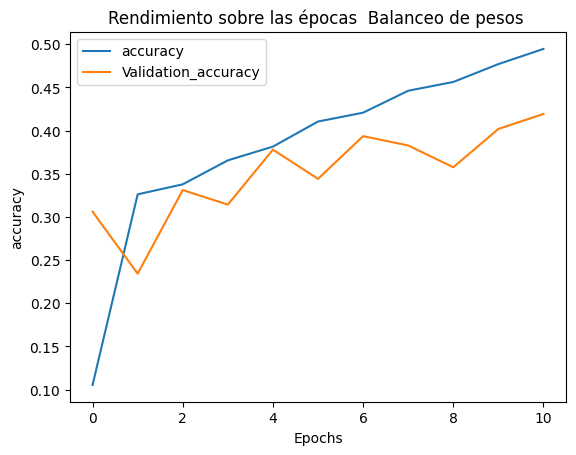

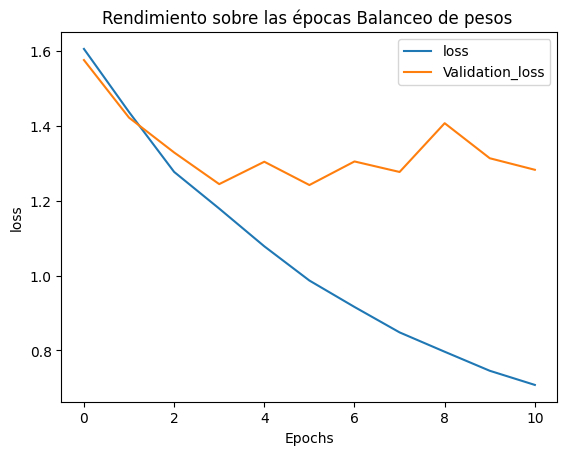

In [ ]:
plot_graphs(history, "accuracy","  Balanceo de pesos ")
plot_graphs(history, "loss"," Balanceo de pesos ")

F1 SCORE

In [ ]:
from sklearn.metrics import f1_score as f1_s

y_pred = model.predict(validation_padded)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir predicciones a etiquetas

# Asumiendo que y_test ya está en formato categórico (one-hot encoded), conviértelo a etiquetas también
y_true_classes = np.argmax(y_test, axis=1)

f1 = f1_s(y_true_classes, y_pred_classes, average='macro')  # 'macro' para un promedio multiclase
print("F1 Score en y_test:", f1)

177/177 [==============================] - 3s 18ms/step
F1 Score en y_test: 0.3825728722122961


MATRIZ DE CONFUSION SENCILLA

  7/177 [>.............................] - ETA: 3s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


177/177 [==============================] - 4s 24ms/step
[[ 634  454  313   56   11]
 [ 845 1168  859  150   24]
 [  92  184  402   77    7]
 [  14   42   83  135   13]
 [   4    7   17   23   25]]


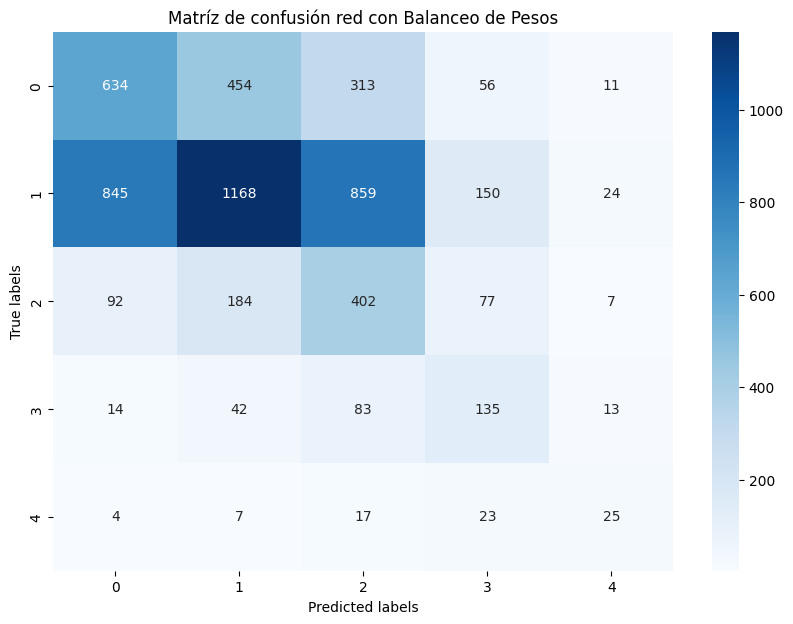

In [ ]:
predictions = model.predict(validation_padded)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)
cm = confusion_matrix(true_labels, predicted_labels)
print(cm)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Matríz de confusión red con Balanceo de Pesos')
plt.show()

LIME

In [ ]:
explainer = LimeTextExplainer(class_names=["Clase 1", "Clase 2", "Clase 3","Clase 4", "clase 5"])

def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
    return model.predict(padded_sequences)

text_instance = "Creería q' esa asquienta costumbre de colarse en el Transmilenio (robo descarado y vergonzoso) es herencia de Petro, quien en algún momento los indujo a semejante conducta como una repudio hacia la obra del Dr. Peñalosa."
exp = explainer.explain_instance(text_instance, predict_proba, num_features=10, top_labels=5)
exp.show_in_notebook()
exp.save_to_file('limeBalanceo.html')

  7/157 [>.............................] - ETA: 2s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


157/157 [==============================] - 3s 18ms/step


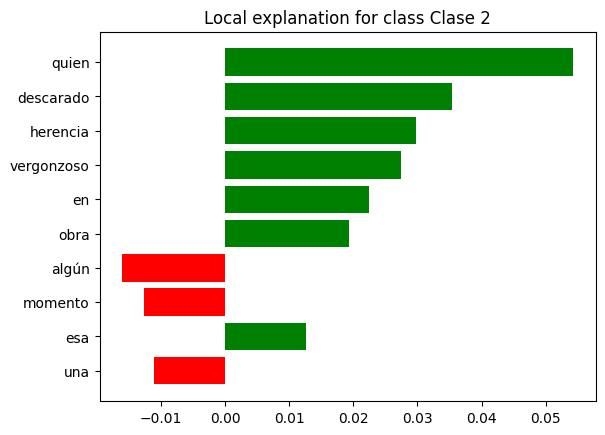

In [ ]:
fig = exp.as_pyplot_figure()


In [ ]:
# 1. Carga el modelo previamente guardado
loaded_model = tensorflow.keras.models.load_model('modelBalanceo.h5', custom_objects={"f1_score": f1_score})
#loaded_model = tensorflow.keras.models.load_model('/content/model (1).h5', custom_objects={"f1_score": f1_score})

# 2. Si deseas, puedes ajustar el learning rate o usar el mismo optimizer
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.001)  # Puedes omitir esta línea si no quieres cambiar el learning rate
class_weights={0:0.76697841 , 1:0.37426153 , 2:1.52642978,  3:3.51019455, 4:11.87 }

# 3. Compila el modelo nuevamente (esto es opcional si no has cambiado nada)
loaded_model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])  # Omitir si no has hecho cambios

# 4. Continúa entrenando el modelo con los datos
history = loaded_model.fit(train_padded, y_train, class_weight=class_weights, epochs=epochs, batch_size=batch_size, validation_data=(validation_padded, y_test), callbacks=callbacks, verbose=1)

Epoch 1/12


/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


705/705 [==============================] - 79s 111ms/step - loss: 1.2099 - accuracy: 0.3817 - val_loss: 1.5369 - val_accuracy: 0.2878
Epoch 2/12
705/705 [==============================] - 66s 94ms/step - loss: 0.9318 - accuracy: 0.4439 - val_loss: 1.3709 - val_accuracy: 0.3440
Epoch 3/12
705/705 [==============================] - 65s 93ms/step - loss: 0.7632 - accuracy: 0.5080 - val_loss: 1.3623 - val_accuracy: 0.3777
Epoch 4/12
705/705 [==============================] - 65s 93ms/step - loss: 0.6218 - accuracy: 0.5878 - val_loss: 1.2940 - val_accuracy: 0.4238
Epoch 5/12
705/705 [==============================] - 70s 99ms/step - loss: 0.5302 - accuracy: 0.6522 - val_loss: 1.3321 - val_accuracy: 0.4781
Epoch 6/12
705/705 [==============================] - 71s 101ms/step - loss: 0.4584 - accuracy: 0.6971 - val_loss: 1.4926 - val_accuracy: 0.4270
Epoch 7/12
705/705 [==============================] - 77s 110ms/step - loss: 0.4004 - accuracy: 0.7343 - val_loss: 1.5624 - val_accuracy: 0.4417


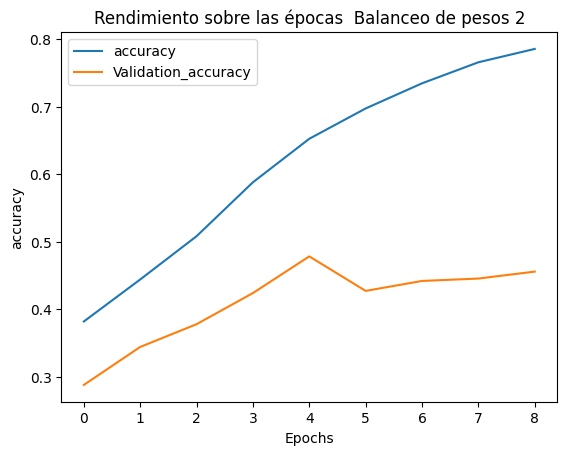

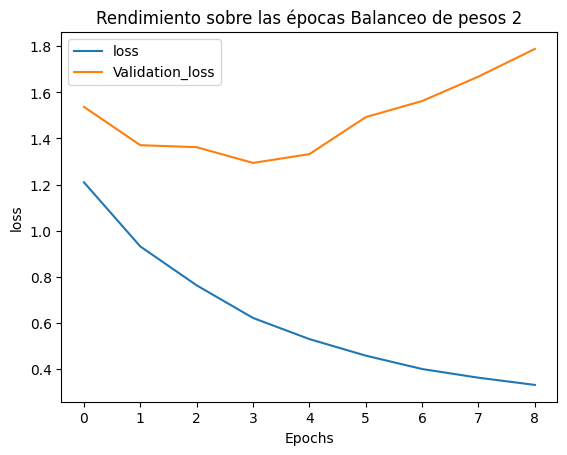

In [ ]:
plot_graphs(history, "accuracy","  Balanceo de pesos 2")
plot_graphs(history, "loss"," Balanceo de pesos 2")

In [ ]:
from sklearn.metrics import f1_score as f1_s

y_pred = loaded_model.predict(validation_padded)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir predicciones a etiquetas

# Asumiendo que y_test ya está en formato categórico (one-hot encoded), conviértelo a etiquetas también
y_true_classes = np.argmax(y_test, axis=1)

f1 = f1_s(y_true_classes, y_pred_classes, average='macro')  # 'macro' para un promedio multiclase
print("F1 Score en y_test:", f1)

  1/177 [..............................] - ETA: 12s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


177/177 [==============================] - 4s 21ms/step
F1 Score en y_test: 0.39452811985968


177/177 [==============================] - 3s 18ms/step
[[ 840  473  110   29   16]
 [1285 1304  288  117   52]
 [ 199  216  285   52   10]
 [  51   54   54  112   16]
 [  13   10    8   17   28]]


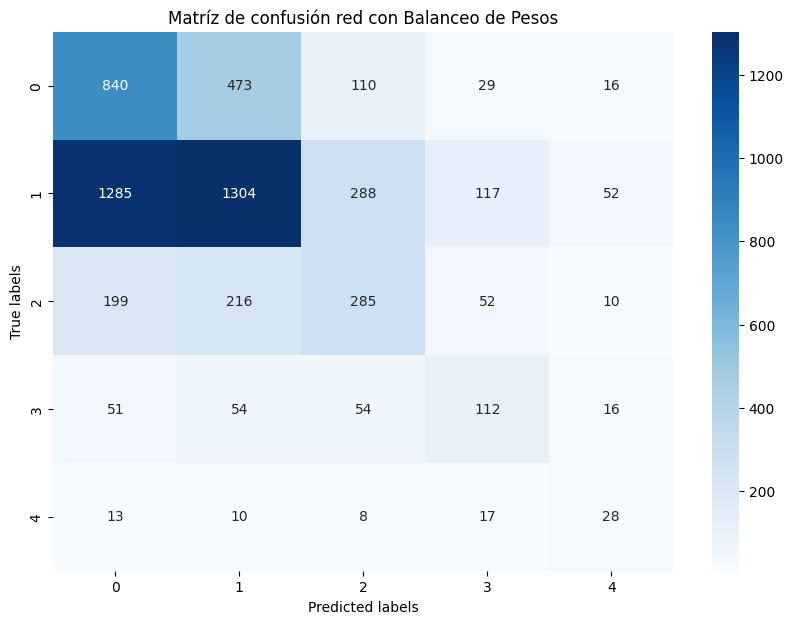

In [ ]:
predictions =loaded_model.predict(validation_padded)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)
cm = confusion_matrix(true_labels, predicted_labels)
print(cm)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Matríz de confusión red con Balanceo de Pesos')
plt.show()

# Síntesis de datos

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(data['ProcTwe'],
                                                    data['Sentiment'],
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    random_state=0)

print('Tamaño del conjunto de entrenamiento:',len(x_train), len(y_train))
print('Tamaño del conjunto de validación:',len(x_test), len(y_test))

Tamaño del conjunto de entrenamiento: 22553 22553
Tamaño del conjunto de validación: 5639 5639


In [ ]:
y_train = y_train - 1
y_train = tensorflow.keras.utils.to_categorical(y_train, 5)
y_test = y_test - 1
y_test = tensorflow.keras.utils.to_categorical(y_test, 5)

HIPERPARAMETROS

In [ ]:
vocab_size = 10000
embedding_dim = 100
max_length = 200
trunc_type = 'post'
padding_type = 'post'
oov_tok = '<OOV>'

In [ ]:
train_articles=x_train.tolist()
validation_articles=x_test.tolist()

TOKENIZADO

In [ ]:
tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok, lower=True)
tokenizer.fit_on_texts(train_articles)
word_index = tokenizer.word_index
#dict(list(word_index.items())[:10])

In [ ]:
train_sequences = tokenizer.texts_to_sequences(train_articles)
train_padded = pad_sequences(train_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
validation_sequences = tokenizer.texts_to_sequences(validation_articles)
validation_padded = pad_sequences(validation_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)


RESAMPLEO Y SINTESIS

In [ ]:

smote_enn = SMOTEENN(random_state=30)
x_resampled,y_resampled = smote_enn.fit_resample(train_padded,y_train)
y_resampled=y_resampled.astype('float32')

In [ ]:
y_resampled=y_resampled.astype(int)
y_test1= y_test.astype(int)

MODELO

In [ ]:
model = tensorflow.keras.Sequential([
    tensorflow.keras.layers.Embedding(vocab_size, embedding_dim),
    tensorflow.keras.layers.Dropout(0.3),
    tensorflow.keras.layers.Bidirectional(tensorflow.keras.layers.LSTM(embedding_dim)),
    tensorflow.keras.layers.Dense(embedding_dim, activation='relu'),
    tensorflow.keras.layers.Dropout(0.3),
    tensorflow.keras.layers.Dense(5, activation='softmax')
])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, None, 100)         1000000   
                                                                 
 dropout_4 (Dropout)         (None, None, 100)         0         
                                                                 
 bidirectional_2 (Bidirecti  (None, 200)               160800    
 onal)                                                           
                                                                 
 dense_4 (Dense)             (None, 100)               20100     
                                                                 
 dropout_5 (Dropout)         (None, 100)               0         
                                                                 
 dense_5 (Dense)             (None, 5)                 505       
                                                      

ENTRENAMIENTO

In [ ]:
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0001)
loss = 'categorical_crossentropy'
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

epochs = 12
batch_size=32

early_stop = tensorflow.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
checkpoint = tensorflow.keras.callbacks.ModelCheckpoint('modelSMOTEEN.h5', save_best_only=True)
log_dir = './logs'
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
callbacks = [early_stop, checkpoint, tensorboard_callback]
history = model.fit(x_resampled,
                    y_resampled,
                    epochs=epochs, batch_size=batch_size, validation_data=(validation_padded,y_test1), callbacks=callbacks, verbose=1)

Epoch 1/12
   1/1247 [..............................] - ETA: 2:23 - loss: 1.6104 - accuracy: 0.1562

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1247/1247 [==============================] - ETA: 0s - loss: 1.4626 - accuracy: 0.2901

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1247/1247 [==============================] - 114s 92ms/step - loss: 1.4626 - accuracy: 0.2901 - val_loss: 2.3502 - val_accuracy: 0.0576
Epoch 2/12
1247/1247 [==============================] - 111s 89ms/step - loss: 1.4119 - accuracy: 0.3320 - val_loss: 2.2585 - val_accuracy: 0.1298
Epoch 3/12
1247/1247 [==============================] - 109s 88ms/step - loss: 1.3524 - accuracy: 0.3840 - val_loss: 2.2623 - val_accuracy: 0.1582
Epoch 4/12
1247/1247 [==============================] - 110s 88ms/step - loss: 1.2829 - accuracy: 0.4322 - val_loss: 2.5712 - val_accuracy: 0.1420
Epoch 5/12
1247/1247 [==============================] - 109s 88ms/step - loss: 1.2187 - accuracy: 0.4805 - val_loss: 2.4068 - val_accuracy: 0.1724
Epoch 6/12
1247/1247 [==============================] - 110s 88ms/step - loss: 1.1619 - accuracy: 0.5102 - val_loss: 2.6378 - val_accuracy: 0.1667
Epoch 7/12
1247/1247 [==============================] - 117s 94ms/step - loss: 1.1154 - accuracy: 0.5388 - val_loss: 2.7422 - val

GRAFICA

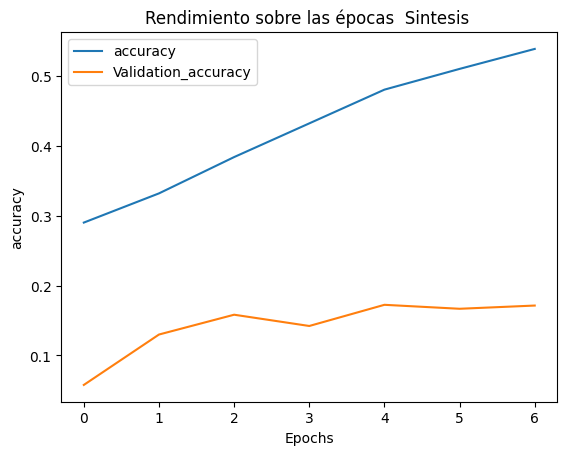

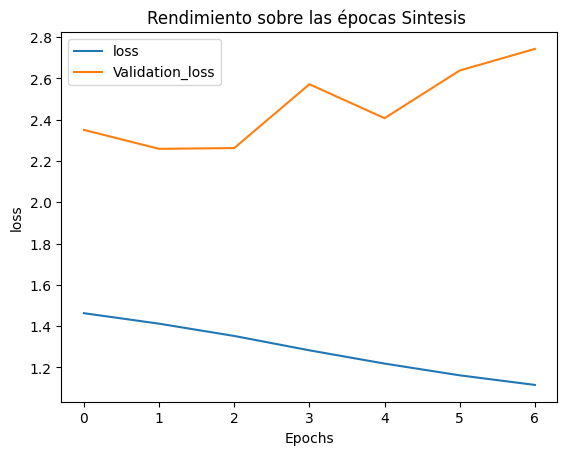

In [ ]:
plot_graphs(history, "accuracy","  Sintesis ")
plot_graphs(history, "loss"," Sintesis ")

F1 SCORE

In [ ]:
from sklearn.metrics import f1_score as f1_s

y_pred = model.predict(validation_padded)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir predicciones a etiquetas

# Asumiendo que y_test ya está en formato categórico (one-hot encoded), conviértelo a etiquetas también
y_true_classes = np.argmax(y_test, axis=1)

f1 = f1_s(y_true_classes, y_pred_classes, average='macro')  # 'macro' para un promedio multiclase
print("F1 Score en y_test:", f1)

177/177 [==============================] - 3s 19ms/step
F1 Score en y_test: 0.1576738844029915


MATRIZ DE CONFUSION SENCILLA

  4/177 [..............................] - ETA: 4s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


177/177 [==============================] - 4s 23ms/step
[[477  15 405 312 259]
 [868  22 928 693 535]
 [148   2 316 158 138]
 [ 23   1  80 126  57]
 [ 10   1  11  29  25]]


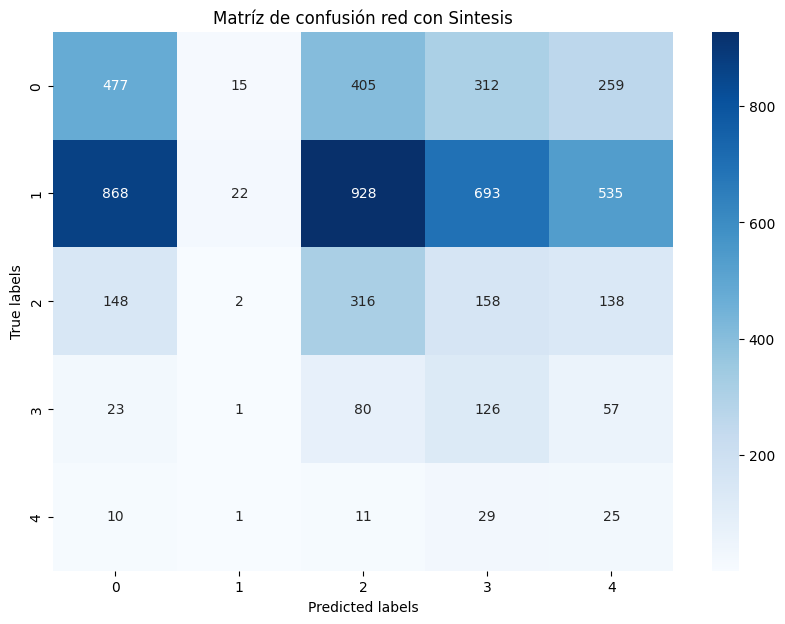

In [ ]:
predictions = model.predict(validation_padded)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)
cm = confusion_matrix(true_labels, predicted_labels)
print(cm)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Matríz de confusión red con Sintesis')
plt.show()

LIME

In [ ]:
explainer = LimeTextExplainer(class_names=["Clase 1", "Clase 2", "Clase 3","Clase 4", "clase 5"])

def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
    return model.predict(padded_sequences)

text_instance = "Creería q' esa asquienta costumbre de colarse en el Transmilenio (robo descarado y vergonzoso) es herencia de Petro, quien en algún momento los indujo a semejante conducta como una repudio hacia la obra del Dr. Peñalosa."
exp = explainer.explain_instance(text_instance, predict_proba, num_features=10, top_labels=5)
exp.show_in_notebook()
exp.save_to_file('limeSintesis.html')

  7/157 [>.............................] - ETA: 2s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


157/157 [==============================] - 3s 18ms/step


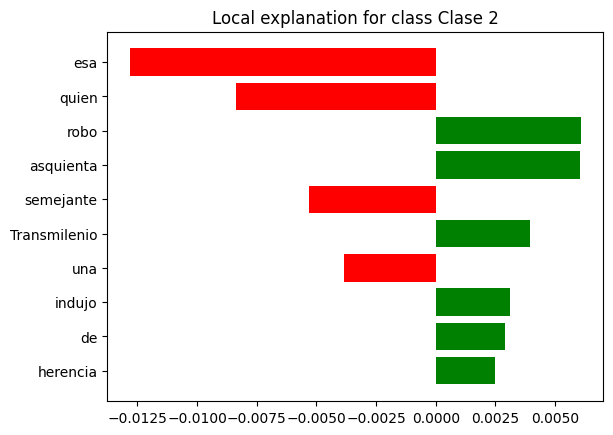

In [ ]:
fig = exp.as_pyplot_figure()


# Carga modelo (1)

In [ ]:
loaded_model = tensorflow.keras.models.load_model('model ().h5', custom_objects={"f1_score": f1_score})


In [ ]:
from keras import backend as K

def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val


In [ ]:
model3 = tensorflow.keras.models.load_model('/content/model (5).h5', custom_objects={"f1_score": f1_score})

F1 SCORE

In [ ]:
from sklearn.metrics import f1_score as f1_s

y_pred = model3.predict(validation_padded)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir predicciones a etiquetas

# Asumiendo que y_test ya está en formato categórico (one-hot encoded), conviértelo a etiquetas también
y_true_classes = np.argmax(y_test, axis=1)

f1 = f1_s(y_true_classes, y_pred_classes, average='macro')  # 'macro' para un promedio multiclase
print("F1 Score en y_test:", f1)

  2/177 [..............................] - ETA: 11s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


177/177 [==============================] - 5s 29ms/step
F1 Score en y_test: 0.16966167548406688


MATRIZ DE CONFUSION SENCILLA

  7/177 [>.............................] - ETA: 3s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


177/177 [==============================] - 4s 20ms/step
[[ 595  622  251    0    0]
 [1193 1323  530    0    0]
 [ 270  341  151    0    0]
 [ 124  108   55    0    0]
 [  27   39   10    0    0]]


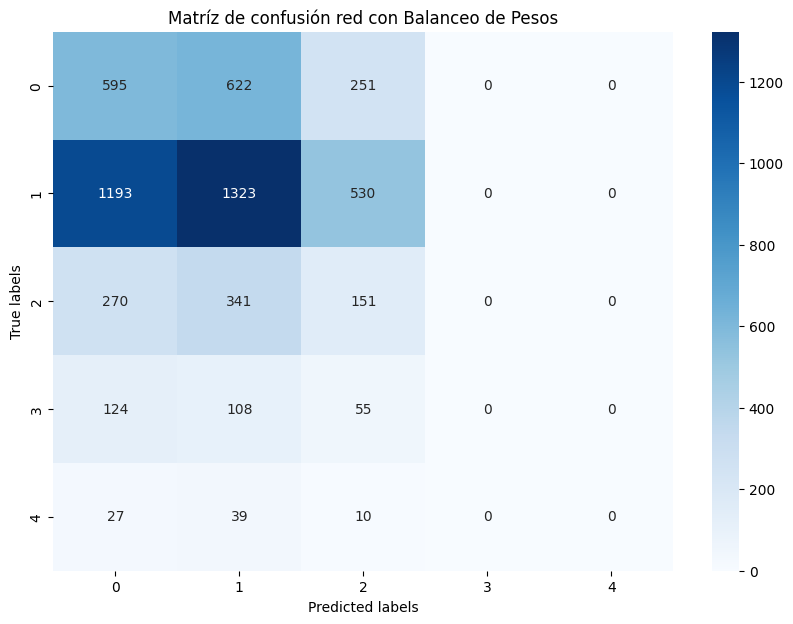

In [ ]:
predictions = model3.predict(validation_padded)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)
cm = confusion_matrix(true_labels, predicted_labels)
print(cm)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Matríz de confusión red con Balanceo de Pesos')
plt.show()

LIME

In [ ]:
explainer = LimeTextExplainer(class_names=["Clase 1", "Clase 2", "Clase 3","Clase 4", "clase 5"])

def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
    return model3.predict(padded_sequences)

text_instance = "Creería q' esa asquienta costumbre de colarse en el Transmilenio (robo descarado y vergonzoso) es herencia de Petro, quien en algún momento los indujo a semejante conducta como una repudio hacia la obra del Dr. Peñalosa."
exp = explainer.explain_instance(text_instance, predict_proba, num_features=10, top_labels=5)
exp.show_in_notebook()
exp.save_to_file('limeBalanceo.html')

  7/157 [>.............................] - ETA: 2s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


157/157 [==============================] - 4s 24ms/step


# Modelo 1 a 3

In [ ]:
data1 = pd.read_csv('/content/drive/MyDrive/TESIS/Archivo2_Basegrande.csv')
data2 = pd.read_csv('/content/drive/MyDrive/TESIS/Archivo1_26256.csv')

In [ ]:
"""data['Sentiment']=data['Sentiment'].replace(1,0)
data['Sentiment']=data['Sentiment'].replace(2,0)

data['Sentiment']=data['Sentiment'].replace(4,2)

data['Sentiment']=data['Sentiment'].replace(5,2)
data['Sentiment']=data['Sentiment'].replace(3,1)
"""

"data['Sentiment']=data['Sentiment'].replace(1,0)\ndata['Sentiment']=data['Sentiment'].replace(2,0)\n\ndata['Sentiment']=data['Sentiment'].replace(4,2)\n\ndata['Sentiment']=data['Sentiment'].replace(5,2)\ndata['Sentiment']=data['Sentiment'].replace(3,1)\n"

In [ ]:
valor4=data2[data2['Sentiment']==4]
valor5=data2[data2['Sentiment']==5]
valor3=data2[data2['Sentiment']==3]
valor2n=pd.concat([valor4,valor5],axis=0)
valor2n.Sentiment=2
valor3.Sentiment=1

<ipython-input-56-36ee932d504f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valor3.Sentiment=1


In [ ]:
df2=pd.concat([valor2n,valor3],axis=0)
df2= df2[['ProcTwe','Sentiment']]
df=data1[['ProcTwe','etiqueta_num']]
df['Sentiment']=df['etiqueta_num']

df=df[['ProcTwe','Sentiment']]
data=pd.concat([df2,df],axis=0)

<ipython-input-57-06af14ac8a99>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Sentiment']=df['etiqueta_num']


In [ ]:
print(data[data['Sentiment'].isna()])
data=data.dropna(subset=['Sentiment'])

                                                 ProcTwe  Sentiment
92           Otro crimen por Robo de bicicleta en Bogotá        NaN
176           @usuario: Mas asesinatos por robo de bicis        NaN
407    Hoy fui víctima de robo en hashtag bogota rest...        NaN
458    Me encanta como @usuario pasa de agache con el...        NaN
477    Atención: hoy se conocerá la condena para la o...        NaN
...                                                  ...        ...
26735  @usuario @usuario @usuario @usuario @usuario @...        NaN
27114  @usuario @usuario @usuario @usuario @usuario @...        NaN
27930  @usuario acabar el congreso y enfermos como ud...        NaN
27936  PORQUE @usuario ESTA DICIENDO EN @usuario QUE ...        NaN
28070  @usuario @usuario @usuario @usuario @usuario @...        NaN

[114 rows x 2 columns]


In [ ]:

data['Sentiment']=data['Sentiment'].astype(int)
data

,ProcTwe,Sentiment
0,Hemos impulsado la marcación de bicicletas com...,2
1,hashtag bogotá - Desarticulada banda dedicada ...,2
69,@usuario @usuario @usuario @usuario @usuario @...,2
124,"hashtag al aire en el sia""Hemos generado todas...",2
125,@usuario No más bicicletas para evitar robo y ...,2
...,...,...
28729,hashtag semana noticias 5142 casos confirmados...,2
28730,hashtag arriba bogotá\n\n¡Operativos para luch...,0
28731,@usuario @usuario @usuario @usuario @usuario @...,0
28732,"@usuario Después del robo de Medellín, la soci...",1


In [ ]:
data.to_csv("TODA1a3.csv")

In [ ]:
stop_words = stopwords.words('spanish')
newStopWords = ['usuario','hashtag','url','usuario usuario','@usuario']
stop_words.extend(newStopWords)
data['ProcTwe'] = data['ProcTwe'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words]))

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(data['ProcTwe'],
                                                    data['Sentiment'],
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    random_state=0)

print('Tamaño del conjunto de entrenamiento:',len(x_train), len(y_train))
print('Tamaño del conjunto de validación:',len(x_test), len(y_test))

Tamaño del conjunto de entrenamiento: 26904 26904
Tamaño del conjunto de validación: 6726 6726


In [ ]:
y_train = tensorflow.keras.utils.to_categorical(y_train, 3)
y_test = tensorflow.keras.utils.to_categorical(y_test, 3)

HIPERPARAMETROS

In [ ]:
vocab_size = 10000
embedding_dim = 100
max_length = 200
trunc_type = 'post'
padding_type = 'post'
oov_tok = '<OOV>'

In [ ]:
train_articles=x_train.tolist()
validation_articles=x_test.tolist()

TOKENIZADO

In [ ]:
tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok, lower=True)
tokenizer.fit_on_texts(train_articles)
word_index = tokenizer.word_index
#dict(list(word_index.items())[:10])

In [ ]:
train_sequences = tokenizer.texts_to_sequences(train_articles)
train_padded = pad_sequences(train_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
validation_sequences = tokenizer.texts_to_sequences(validation_articles)
validation_padded = pad_sequences(validation_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)


In [ ]:
model = tensorflow.keras.Sequential([
    tensorflow.keras.layers.Embedding(vocab_size, embedding_dim),
    tensorflow.keras.layers.Dropout(0.2),
    tensorflow.keras.layers.Bidirectional(tensorflow.keras.layers.LSTM(embedding_dim)),
    tensorflow.keras.layers.Dense(embedding_dim, activation='relu'),
    tensorflow.keras.layers.Dropout(0.2),
    tensorflow.keras.layers.Dense(3, activation='softmax')
])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, None, 100)         1000000   
                                                                 
 dropout_4 (Dropout)         (None, None, 100)         0         
                                                                 
 bidirectional_2 (Bidirecti  (None, 200)               160800    
 onal)                                                           
                                                                 
 dense_4 (Dense)             (None, 100)               20100     
                                                                 
 dropout_5 (Dropout)         (None, 100)               0         
                                                                 
 dense_5 (Dense)             (None, 3)                 303       
                                                      

In [ ]:
from sklearn.metrics import f1_score


In [ ]:
optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.00005)
loss = 'categorical_crossentropy'
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

# 6. Ajuste de hiperparámetros
epochs = 12
batch_size=32

# 7. Callbacks y puntos de control
early_stop = tensorflow.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
checkpoint = tensorflow.keras.callbacks.ModelCheckpoint('model1a3.h5', save_best_only=True)
log_dir = './logs'
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
callbacks = [early_stop, checkpoint, tensorboard_callback]

class_weights={0:0.581,1:1.036,2:3.176}
# Entrenamiento del modelo
history = model.fit(train_padded,
                    y_train,
                    class_weight=class_weights,
                    epochs=epochs, batch_size=batch_size, validation_data=(validation_padded,y_test), callbacks=callbacks, verbose=1)

Epoch 1/12


/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


841/841 [==============================] - ETA: 0s - loss: 1.0925 - accuracy: 0.4012

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


841/841 [==============================] - 85s 102ms/step - loss: 1.0925 - accuracy: 0.4012 - val_loss: 1.0018 - val_accuracy: 0.5949
Epoch 2/12
841/841 [==============================] - 85s 101ms/step - loss: 0.9397 - accuracy: 0.5671 - val_loss: 0.8820 - val_accuracy: 0.5946
Epoch 3/12
841/841 [==============================] - 81s 97ms/step - loss: 0.8204 - accuracy: 0.6286 - val_loss: 0.8776 - val_accuracy: 0.5882
Epoch 4/12
841/841 [==============================] - 82s 97ms/step - loss: 0.7602 - accuracy: 0.6631 - val_loss: 0.8797 - val_accuracy: 0.5880
Epoch 5/12
841/841 [==============================] - 87s 104ms/step - loss: 0.7198 - accuracy: 0.6824 - val_loss: 0.8368 - val_accuracy: 0.6158
Epoch 6/12
841/841 [==============================] - 83s 99ms/step - loss: 0.6869 - accuracy: 0.6955 - val_loss: 0.8794 - val_accuracy: 0.5908
Epoch 7/12
841/841 [==============================] - 86s 103ms/step - loss: 0.6624 - accuracy: 0.7055 - val_loss: 0.8551 - val_accuracy: 0.6108

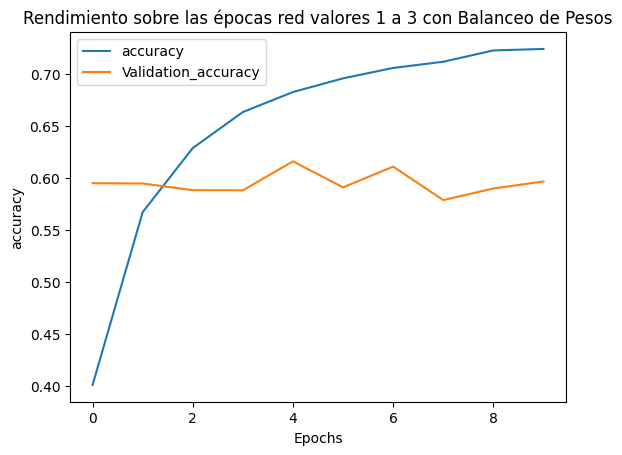

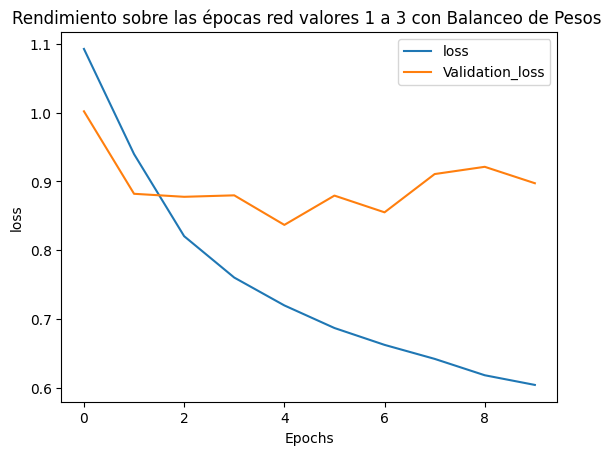

In [ ]:
plot_graphs(history, "accuracy"," red valores 1 a 3 con Balanceo de Pesos")
plot_graphs(history, "loss"," red valores 1 a 3 con Balanceo de Pesos ")

F1 SCORE

In [ ]:
from sklearn.metrics import f1_score as f1_s

y_pred = model.predict(validation_padded)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir predicciones a etiquetas

# Asumiendo que y_test ya está en formato categórico (one-hot encoded), conviértelo a etiquetas también
y_true_classes = np.argmax(y_test, axis=1)

f1 = f1_s(y_true_classes, y_pred_classes, average='macro')  # 'macro' para un promedio multiclase
print("F1 Score en y_test:", f1)

211/211 [==============================] - 7s 35ms/step
F1 Score en y_test: 0.5414324791874309


MATRIZ DE CONFUSION SENCILLA

  3/211 [..............................] - ETA: 6s 

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


211/211 [==============================] - 7s 31ms/step
[[2529 1070  221]
 [ 671 1113  423]
 [  98  231  370]]


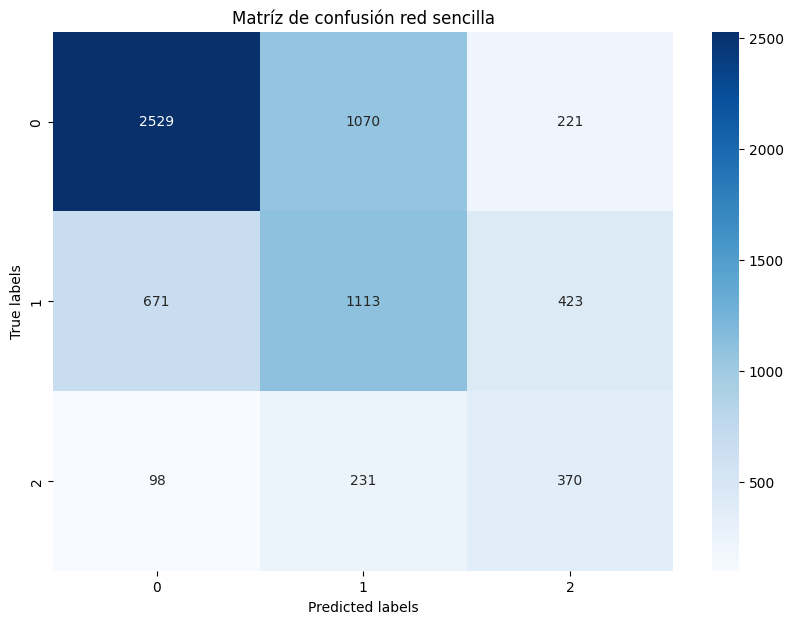

In [ ]:
predictions = model.predict(validation_padded)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)
cm = confusion_matrix(true_labels, predicted_labels)
print(cm)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Matríz de confusión red sencilla')
plt.show()

LIME

In [ ]:
explainer = LimeTextExplainer(class_names=["Clase 1", "Clase 2", "Clase 3"])

def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
    return model.predict(padded_sequences)

text_instance = "Creería q' esa asquienta costumbre de colarse en el Transmilenio (robo descarado y vergonzoso) es herencia de Petro, quien en algún momento los indujo a semejante conducta como una repudio hacia la obra del Dr. Peñalosa."
exp = explainer.explain_instance(text_instance, predict_proba, num_features=10, top_labels=3)
exp.show_in_notebook()
exp.save_to_file('limeSencillo1a3.html')

  3/157 [..............................] - ETA: 4s

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


157/157 [==============================] - 4s 27ms/step


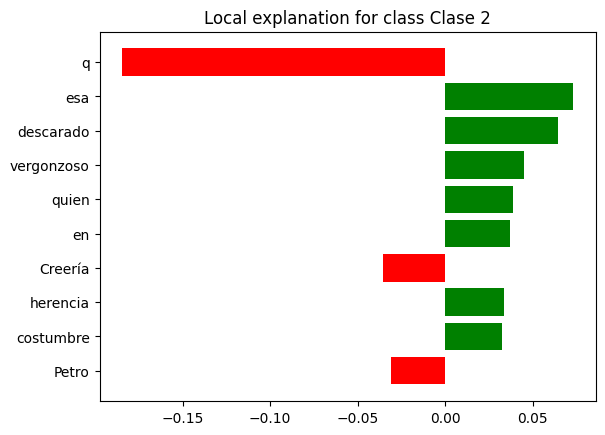

In [ ]:
fig = exp.as_pyplot_figure()


# Comparación con Transformers

In [ ]:
!pip install transformers
!pip install pysentimiento

In [ ]:
import transformers
from transformers import AutoTokenizer, AutoModelForSequenceClassification, AutoModelForMaskedLM

#tokenizer = AutoTokenizer.from_pretrained("pysentimiento/robertuito-base-uncased")

#model = AutoModelForMaskedLM.from_pretrained("pysentimiento/robertuito-base-uncased")
tokenizer = AutoTokenizer.from_pretrained("finiteautomata/beto-sentiment-analysis")
#tokenizer = AutoTokenizer.from_pretrained('pysentimiento/robertuito-base-cased')

model = AutoModelForSequenceClassification.from_pretrained("finiteautomata/beto-sentiment-analysis")

from pysentimiento import create_analyzer
import torch
import tensorflow as tf
import numpy as np
from sklearn.model_selection import train_test_split
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
from textwrap import wrap

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
analyzer = create_analyzer(task="sentiment", lang="es")

In [ ]:
dataframe=pd.DataFrame(x_test)
dataframe

,ProcTwe
22903,"sábado transmi iba , capturaron banda venezola..."
4572,bogota noctambula Policía debe dedicarse captu...
7566,hace entonces hagamos viral vídeo RT mostrar c...
21224,"problema cada vez subo taxi bogotano, siento v..."
12576,Dizque independientes política tradicional cor...
...,...
17731,trasporte taxis hago certificar llevé familiar...
26984,emoji móvil flecha emoji video | hombre transp...
10678,poner ciudadanos encima ley. apología robo ata...
25960,Pechuga 30mil robo !!! Pilas


In [ ]:
x_test2=x_test.to_list()

In [ ]:
res=[]
for i in range(6726):
  result=analyzer.predict(str(x_test2[i]))
  res.append(result)
print("okr")

okr


In [ ]:
dataframe['BETO']=res

In [ ]:
dataframe

,ProcTwe,BETO
22903,"sábado transmi iba , capturaron banda venezola...","AnalyzerOutput(output=NEU, probas={NEU: 0.624,..."
4572,bogota noctambula Policía debe dedicarse captu...,"AnalyzerOutput(output=NEG, probas={NEG: 0.666,..."
7566,hace entonces hagamos viral vídeo RT mostrar c...,"AnalyzerOutput(output=NEU, probas={NEU: 0.491,..."
21224,"problema cada vez subo taxi bogotano, siento v...","AnalyzerOutput(output=NEG, probas={NEG: 0.851,..."
12576,Dizque independientes política tradicional cor...,"AnalyzerOutput(output=NEG, probas={NEG: 0.805,..."
...,...,...
17731,trasporte taxis hago certificar llevé familiar...,"AnalyzerOutput(output=NEU, probas={NEU: 0.904,..."
26984,emoji móvil flecha emoji video | hombre transp...,"AnalyzerOutput(output=NEU, probas={NEU: 0.540,..."
10678,poner ciudadanos encima ley. apología robo ata...,"AnalyzerOutput(output=NEG, probas={NEG: 0.855,..."
25960,Pechuga 30mil robo !!! Pilas,"AnalyzerOutput(output=NEU, probas={NEU: 0.776,..."


In [ ]:
dataframe.BETO=dataframe.BETO.apply(lambda x: pd.Series(str(x).split('output=')[1][:3]))

In [ ]:
dataframe.BETO=dataframe.BETO.replace({"NEG":"0","NEU":"1","POS":"2"})

In [ ]:
y_pred = dataframe.BETO.values.tolist()
y_pred= [int(x) for x in y_pred]


In [ ]:
y_true=np.argmax(y_test,axis=1)

In [ ]:
dataframe["Valor"]=y_true
y_true = dataframe.Valor.values.tolist()
y_true= [int(x) for x in y_true]

In [ ]:
from sklearn.metrics import f1_score
f1_score(y_true, y_pred, average='macro')

0.407500422175391